### This notebook to to evaluate the use of tensorflow to produce a regression model to predict the song release year

# Load Dataset
Load the Million Song Dataset from 'YearPredictionsMSP.txt' (expected to be in the data folder)
Dataset Source: https://archive.ics.uci.edu/ml/datasets/YearPredictionMSD

The following information is from the UCI webpage for this dataset (linked above):

Data Set Information:
You should respect the following train / test split:
train: first 463,715 examples
test: last 51,630 examples
It avoids the 'producer effect' by making sure no song
from a given artist ends up in both the train and test set.

Attribute Information:
90 attributes, 12 = timbre average, 78 = timbre covariance
The first value is the year (target), ranging from 1922 to 2011.
Features extracted from the 'timbre' features from The Echo Nest API.
We take the average and covariance over all 'segments', each segment
being described by a 12-dimensional timbre vector.

Relevant Papers:
see the website: http://millionsongdataset.com/

In [66]:
from IPython.display import display
from utils import dataset
from importlib import reload
from utils.dataset import Dataset
from sklearn import preprocessing as skpp
from sklearn.decomposition import TruncatedSVD
import numpy as np
reload(dataset)

# Load the data from the text file
train, test = dataset.load_msd()

norm = skpp.Normalizer(norm='l2')
norm.fit(test.data)
test.data = norm.transform(test.data)
train.data = norm.transform(train.data)

# Apply some randomness to the years so they can
# be better scaled to a uniform distribution
train.years = train.years + 2 * np.random.rand(train.years.shape[0]) - 1
test.years = test.years + 2 * np.random.rand(test.years.shape[0]) - 1

# svd = TruncatedSVD(n_components=60)
# svd.fit(train.data)
# train.data = svd.transform(train.data)
# test.data = svd.transform(test.data)

In [183]:
import tensorflow as tf
import keras
from keras import layers
from matplotlib import pyplot as plt
from tensorflow.keras.layers.experimental import preprocessing

def build_and_compile_model(train: Dataset): 
    model = keras.Sequential([
        layers.InputLayer(train.data.shape[1]),

        layers.Dense(90, activation='relu'), layers.Dropout(0.2),
        layers.Dense(90, activation='relu'), layers.Dropout(0.2),
        layers.Dense(90, activation='relu'), layers.Dropout(0.2),
        layers.Dense(90, activation='relu'), layers.Dropout(0.2),

        layers.Dense(1, activation='sigmoid')
    ])
    model.compile(loss='mean_absolute_error', optimizer='adam')
    return model


def plot_loss(history):
  plt.plot(history.history['loss'], label='loss')
  plt.plot(history.history['val_loss'], label='val_loss')
  plt.xlabel('Epoch')
  plt.ylabel('Error (years)')
  plt.legend()
  plt.grid(True)
  plt.show()

In [184]:
keras.backend.clear_session()
model = build_and_compile_model(train)
print(model.summary())

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 90)                8190      
_________________________________________________________________
dropout (Dropout)            (None, 90)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 90)                8190      
_________________________________________________________________
dropout_1 (Dropout)          (None, 90)                0         
_________________________________________________________________
dense_2 (Dense)              (None, 90)                8190      
_________________________________________________________________
dropout_2 (Dropout)          (None, 90)                0         
_________________________________________________________________
dense_3 (Dense)              (None, 90)                8

Epoch 1/10
2899/2899 [==============================] - 13s 5ms/step - loss: 0.1957 - val_loss: 0.1965
Epoch 2/10
2899/2899 [==============================] - 14s 5ms/step - loss: 0.1956 - val_loss: 0.1946
Epoch 3/10
2899/2899 [==============================] - 13s 4ms/step - loss: 0.1953 - val_loss: 0.1959
Epoch 4/10
2899/2899 [==============================] - 14s 5ms/step - loss: 0.1951 - val_loss: 0.1945
Epoch 5/10
2899/2899 [==============================] - 13s 4ms/step - loss: 0.1950 - val_loss: 0.1949
Epoch 6/10
2899/2899 [==============================] - 14s 5ms/step - loss: 0.1949 - val_loss: 0.1956
Epoch 7/10
2899/2899 [==============================] - 13s 4ms/step - loss: 0.1948 - val_loss: 0.1941
Epoch 8/10
2899/2899 [==============================] - 14s 5ms/step - loss: 0.1945 - val_loss: 0.1943
Epoch 9/10
2899/2899 [==============================] - 14s 5ms/step - loss: 0.1944 - val_loss: 0.1947
Epoch 10/10
2899/2899 [==============================] - 13s 5ms/step - l

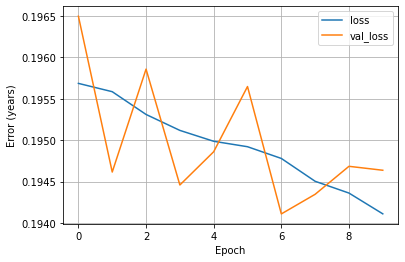

In [190]:
import numpy as np

train_years = np.reshape(train.years, (-1, 1))
test_years = np.reshape(test.years, (-1, 1))

# y_scaler = skpp.MinMaxScaler().fit(train_years)
# y_scaler = skpp.PowerTransformer().fit(train_years)
y_scaler = skpp.QuantileTransformer().fit(train_years)
y_train = y_scaler.transform(train_years)
y_test = y_scaler.transform(test_years)

history = model.fit(train.data, y_train, validation_split=0.2, epochs=10, batch_size=128)
plot_loss(history)

In [191]:
score = model.evaluate(train.data, y_train, verbose=0)
print("Train loss:", score)

score = model.evaluate(test.data, y_test, verbose=0)
print("Test loss:", score)

Train loss: 0.18996888399124146
Test loss: 0.19855593144893646


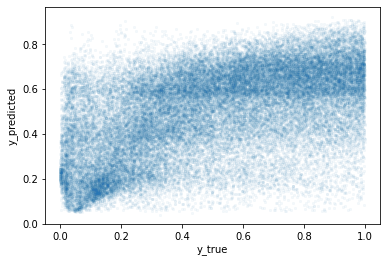

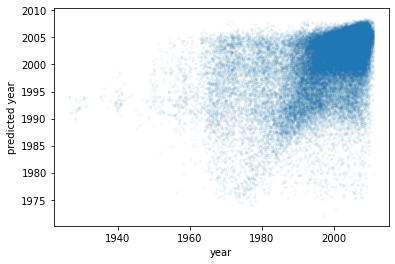

In [192]:
y_pred = model.predict(test.data)
years_pred = y_scaler.inverse_transform(y_pred)
years_true = y_scaler.inverse_transform(y_test)

plt.figure()
plt.scatter(y_test, y_pred, marker='.', linewidth=.1, alpha=0.05)
# plt.plot(years_true, years_true, color='k')
plt.xlabel('y_true')
plt.ylabel('y_predicted')
plt.show()

plt.figure()
plt.scatter(years_true, years_pred, marker='.', linewidth=.1, alpha=0.05)
# plt.plot(years_true, years_true, color='k')
plt.xlabel('year')
plt.ylabel('predicted year')
plt.show()

Text(0, 0.5, 'Probability (%)')

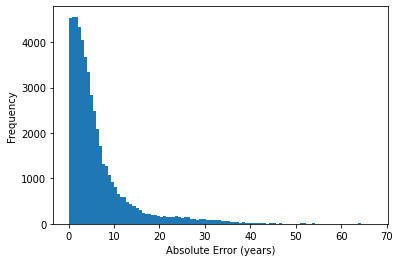

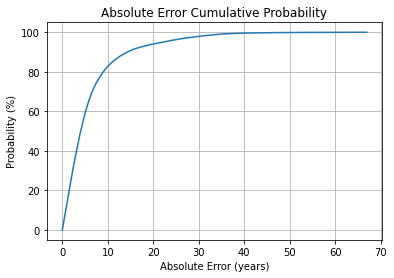

In [189]:
# Compute the errors in years and create a histogram to get a sense of
# how often the model makes good/bad predictions
abs_error = np.abs(years_true - years_pred)
abs_error = np.sort(abs_error, axis=None)

plt.figure()
plt.hist(abs_error, bins=100);
plt.xlabel('Absolute Error (years)')
plt.ylabel('Frequency')

plt.figure()
y = np.ones(abs_error.shape)
plt.plot(abs_error, 100 * np.cumsum(y) / np.sum(y))
# plt.hist(abs_error, bins=1000, density=True, cumulative=True, histtype='step');
plt.grid()
plt.title('Absolute Error Cumulative Probability')
plt.xlabel('Absolute Error (years)')
plt.ylabel('Probability (%)')


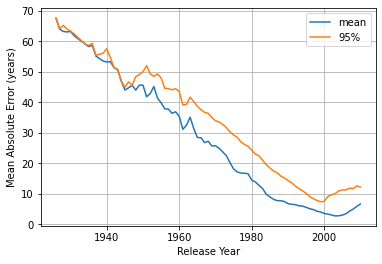

In [209]:
# Plot the mean error  by actual year
abs_error = np.abs(years_true - years_pred)

years_rounded = years_true.astype(int).flatten()
year_list = list(set(years_rounded))
error_mean = [np.mean(abs_error[y == years_rounded]) for y in year_list]
error_95p = [np.percentile(abs_error[y == years_rounded], 95) for y in year_list]

plt.plot(year_list, error_mean)
plt.plot(year_list, error_95p)
plt.grid()
plt.xlabel('Release Year')
plt.ylabel('Absolute Error (years)')
plt.legend(('mean', '95%'))